# Dense- vs edge-sampling of the plane-fit vertical velocity — a walkthrough

Runnable companion to `test_footprint_pipeline.py`. It explains, tests, and visualizes **how
well an array's plane fit reproduces the true area-mean vertical velocity**, and splits that
error into a **plane-fit-to-shape** part and a **sparse-sampling** part. Everything is live —
edit the knob cell at the bottom and re-run. Figures are also saved to `test_figs/`.

## The estimator, the truth, and the error

An array's plane fit reports **one slope per component** — it fits $u=a+bx+cy$ over its
samples, reads off $\partial u/\partial x=b,\ \partial v/\partial y=c$, so its divergence
estimate is a single constant $\mathrm{div}_{\rm est}=b+c$. It integrates continuity to get
$w$. The truth is the **area-mean of the model's real (curved) divergence over the footprint**,
$\langle\mathrm{div}\rangle$, and the error at depth $H$ is

$$w_{\rm err}=H\,(\mathrm{div}_{\rm est}-\langle\mathrm{div}\rangle)\times 86400\quad[\mathrm{m\,day^{-1}}].$$

## Two samplings (the repo's tier-1 / tier-2 idea, renamed)

- **dense-sampling** — a plane fit to the footprint filled at the **model resolution (1/24°)**:
  "the best a single plane can do given the full field." Its error is the *plane-fit-to-shape*
  error (a flat plane can't equal the area-mean of a curved field).
- **edge-sampling** — a plane fit to the **actual array vertices** (square4 = 4 corners; an
  optional TAO center at (0,0) doesn't change the slope). This is what a real array measures,
  so its error is *dense + the sparse-sampling penalty*.

So **`edge − dense` is meant to isolate the cost of sparse sampling** — and confirming that is
the point of this file. The one caveat, made explicit below: the area-mean divergence is a
**boundary quantity** (divergence theorem, $\langle\mathrm{div}\rangle=\oint\!\mathbf{u}\cdot\mathbf{n}\,dl/A$),
so for a **symmetric/separable** field there's no along-edge structure for the corners to miss,
and edge-sampling can *match or beat* dense (a negative apparent penalty). Once the field varies
**along the edges** (non-separable), the corners miss it and **dense wins** — the real penalty.

## Four synthetic cases

| case | velocity $U$ | nature | expected |
|---|---|---|---|
| 1 linear | $Sx$ | constant div | both exact |
| 2 even | $Cx^2$ | odd div | both cancel |
| 3 odd | $Cx^3$ | separable, symmetric | **edge exact, dense biased** (edge wins) |
| 4 mixed | $C(xy^2+\tfrac12 x^3)$ | **non-separable** | **dense beats edge** (real sparse penalty) |

The truth is computed in **closed form**, and the plane fits use `osse_tools`' production
projection, so the numbers are exact and tied to the real pipeline.


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

import osse_tools as ot
import test_footprint_pipeline as tfp   # the tests + figure builders live here

plt.rcParams.update({'axes.labelsize': 12.5, 'axes.labelweight': 'bold',
                     'axes.titlesize': 11, 'legend.fontsize': 9.5, 'figure.dpi': 110})
from IPython.display import Image
FIGDIR = tfp.FIGDIR; os.makedirs(FIGDIR, exist_ok=True)
print('array shape     :', tfp.SHAPE, f'{tfp.WIDTH:g} x {tfp.HEIGHT:g} deg   depth {tfp.DEPTH_M:g} m')
print('dense sampling  : model resolution dx =', round(tfp.MODEL_DX, 4), 'deg')
print('amplitudes      : S=%g  C_even=%g  C_odd=%g  C_mix=%g'
      % (tfp.S_LIN, tfp.C_EVEN, tfp.C_ODD, tfp.C_MIX))


array shape     : square4 1.5 x 1.5 deg   depth 70 m
dense sampling  : model resolution dx = 0.0417 deg
amplitudes      : S=0.125  C_even=0.0625  C_odd=0.03125  C_mix=0.05


## Step 1 — compute dense vs edge for all four cases

`compute_cases` samples each analytic field with the dense (1/24°) and edge (4-corner)
geometries, fits the plane, and compares to the closed-form area-mean truth.

In [2]:
res = tfp.compute_cases()
tfp.print_table(res)



  synthetic footprint w-error  (square4 1.5x1.5 deg, 70 m, dense sampling at model dx=0.0417 deg):
    case        truth_div    dense_div     edge_div  wERR dense   wERR edge  winner
    linear      2.248e-06    2.248e-06    2.248e-06      -0.000      +0.000  tie
    even        0.000e+00   -3.148e-23   -1.059e-22      -0.000      -0.000  tie
    odd         3.162e-07    2.000e-07    3.162e-07      -0.702      +0.000  edge
    mixed       4.216e-07    3.380e-07    7.588e-07      -0.505      +2.040  dense
    fine       -5.215e-07   -8.659e-09    1.427e-07      +3.102      +4.017  dense
    combo      -3.099e-07    1.892e-07    1.414e-07      +3.019      +2.729  edge


Read the `winner` column: linear/even are a tie (both ~0); **odd** — the separable case —
has **edge** exact and dense biased; **mixed** — the non-separable case — has **dense** beating
edge. That is the whole story, and the next figure is the headline.

## Step 2 — headline: dense vs edge error, all four cases

saved /home/edavenport/analysis/tpose24-osse/test_figs/dense_vs_edge_error.png


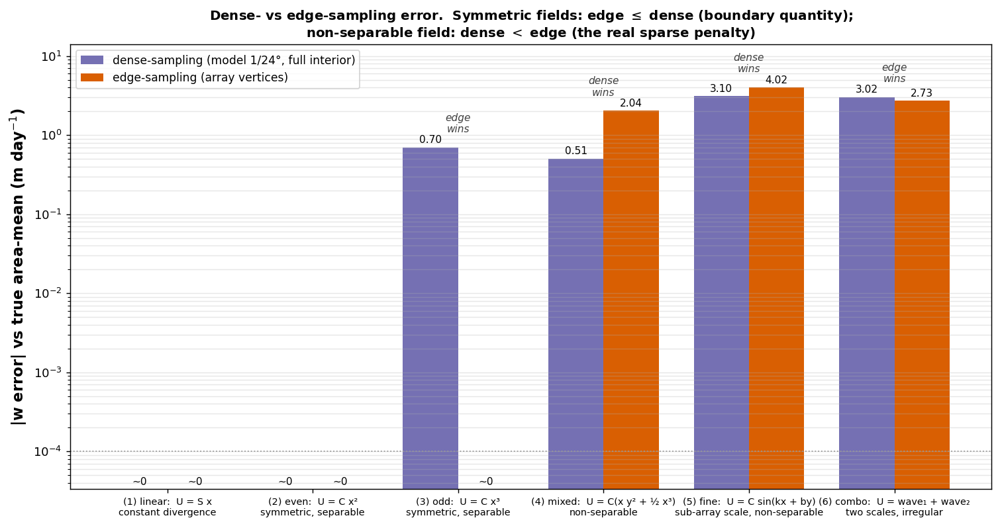

In [3]:
fn = tfp.fig_dense_vs_edge_error(res); print('saved', fn); Image(fn)

## Step 3 — the assertions

These check the mechanism quantitatively, and `test_pipeline_estimator` confirms the production
`planefit_divergence_stencil` reproduces the analytic estimates (so this is tied to the code
that makes the study's maps).

In [4]:
for name, fn in [('linear & even exact',   lambda: tfp.test_linear_and_even_exact(res)),
                 ('odd: edge beats dense',  lambda: tfp.test_odd_edge_beats_dense(res)),
                 ('mixed: dense beats edge', lambda: tfp.test_mixed_dense_beats_edge(res)),
                 ('pipeline estimator',     lambda: tfp.test_pipeline_estimator(res))]:
    try:
        fn()
    except AssertionError as e:
        print(f'  FAILED [{name}]: {e}')


  (1) linear & even -> dense and edge both exact (w err ~ 0)  OK
  (2) odd (separable): edge exact, dense biased -> edge beats dense  OK
  (3) mixed (non-separable): dense beats edge (real sparsity penalty)  OK


  (4) production planefit_divergence_stencil matches the analytic estimates  OK


## Step 4 — per-shape, per-case fields: 2-D, 3-D, and the plane fit

One figure **per array shape** (square / hexagon / diamond) **and test case**, saved under
`test_figs/<shape>/`. Two columns — **velocity** (left) and **divergence** (right) — each with
three rows:

1. the **2-D field** (color), with the array footprint polygon and its gliders (green);
2. the same field as a **3-D surface** (height = the value that is color in row 1);
3. the dense (purple) and edge (orange) **plane fits over the true field** (gray).

For **velocity** that is all we show — the mean velocity is irrelevant; what matters is how the
plane captures the field (its slope is the gradient we want). For **divergence** the plane fit
collapses to a single constant (a flat plane), and we also draw the **true mean** (green): the
gap between the flat plane-fit and the green true-mean plane **is** the $w$ error. No 1-D
transects — the field is fundamentally 2-D.

The **shape** sets the gliders (edge sampling), the dense interior fill, and the true area-mean,
so the same field is graded against each array. The **5th "fine" case** is a non-separable
tilted wave with structure *smaller than the array*: a plane fit cannot represent it, so both
samplings err a lot (large $w$ error). The **6th "combo" case** superposes two tilted waves at
different scales, giving an irregular, non-uniform ("beating") field — closer to a real flow
than any single mode.

All 18 figures are generated below; the square set and the three hardest cases (mixed, fine,
combo) for the other shapes are shown inline.

saved /home/edavenport/analysis/tpose24-osse/test_figs/square/mechanism_linear.png


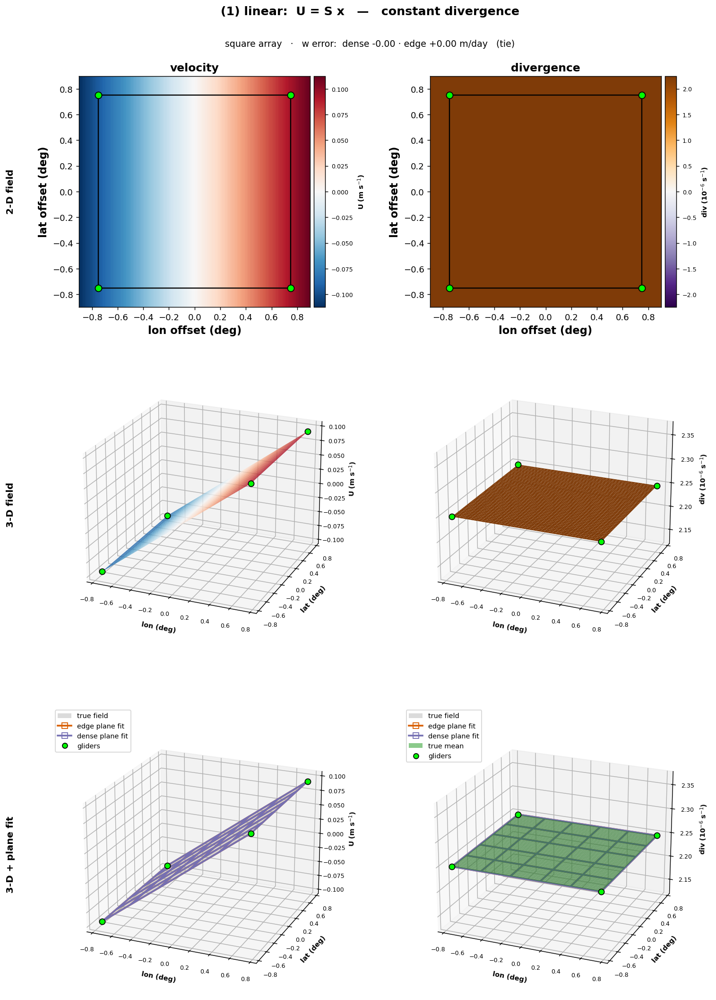

saved /home/edavenport/analysis/tpose24-osse/test_figs/square/mechanism_even.png


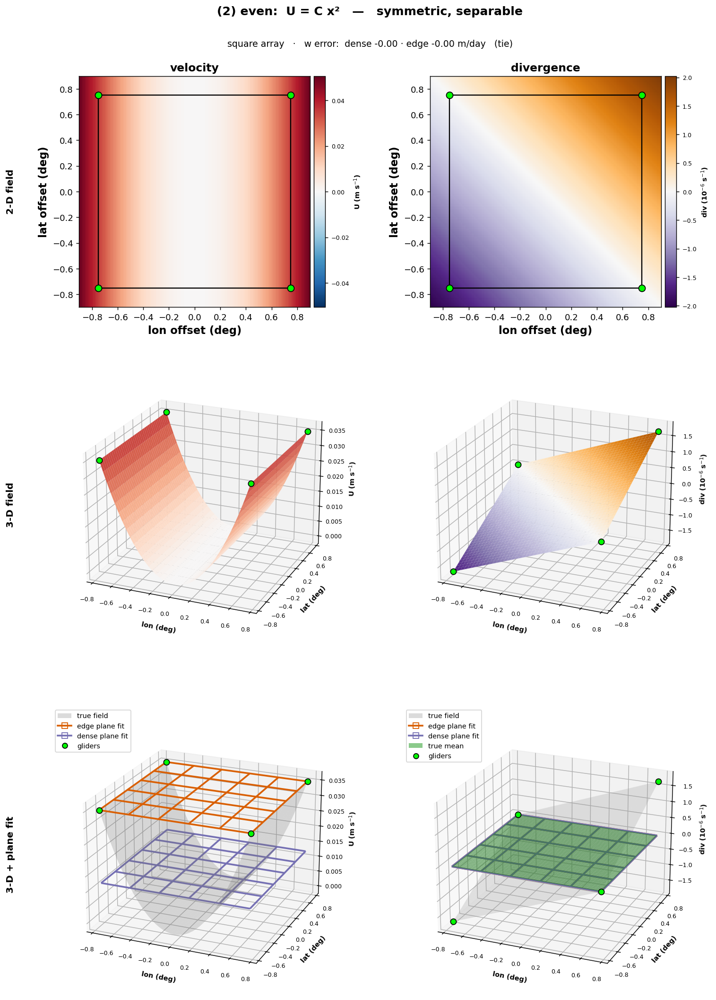

saved /home/edavenport/analysis/tpose24-osse/test_figs/square/mechanism_odd.png


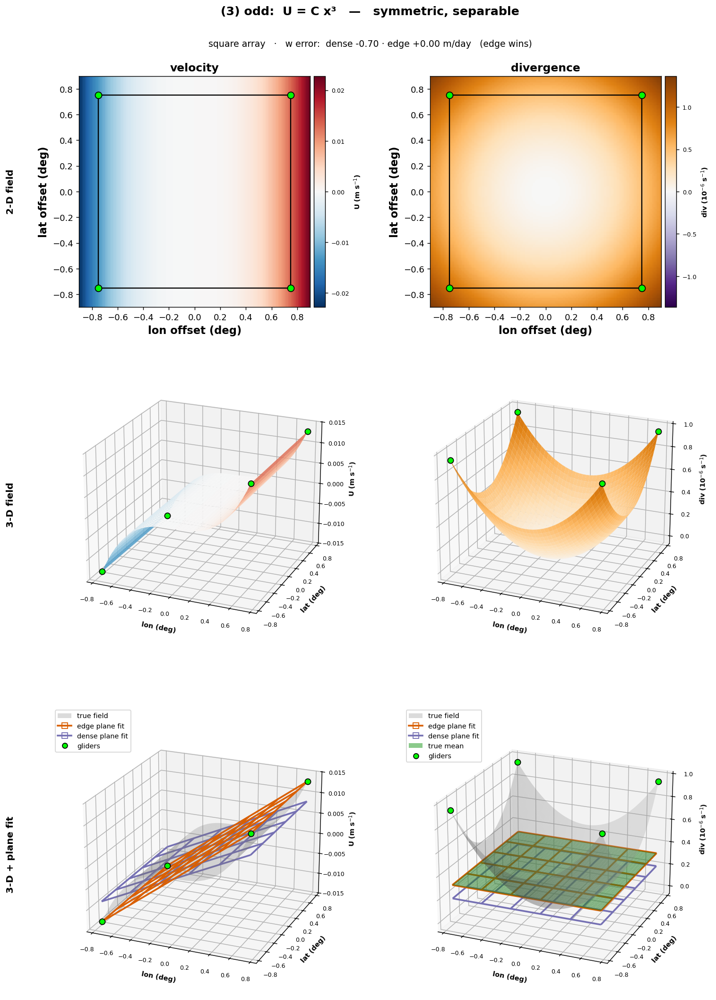

saved /home/edavenport/analysis/tpose24-osse/test_figs/square/mechanism_mixed.png


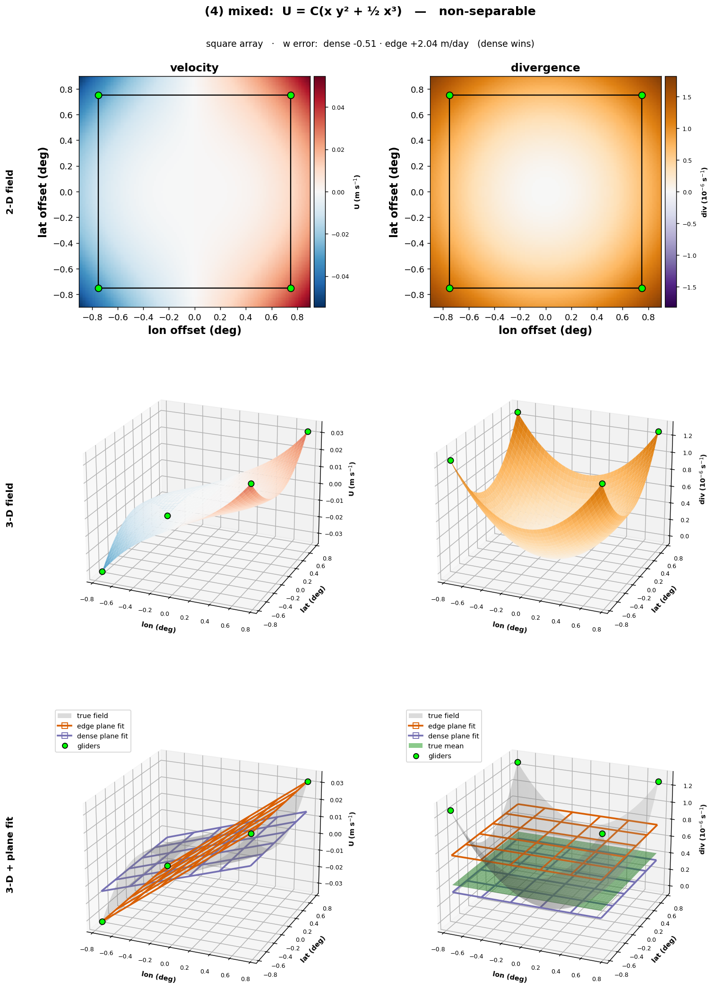

saved /home/edavenport/analysis/tpose24-osse/test_figs/square/mechanism_fine.png


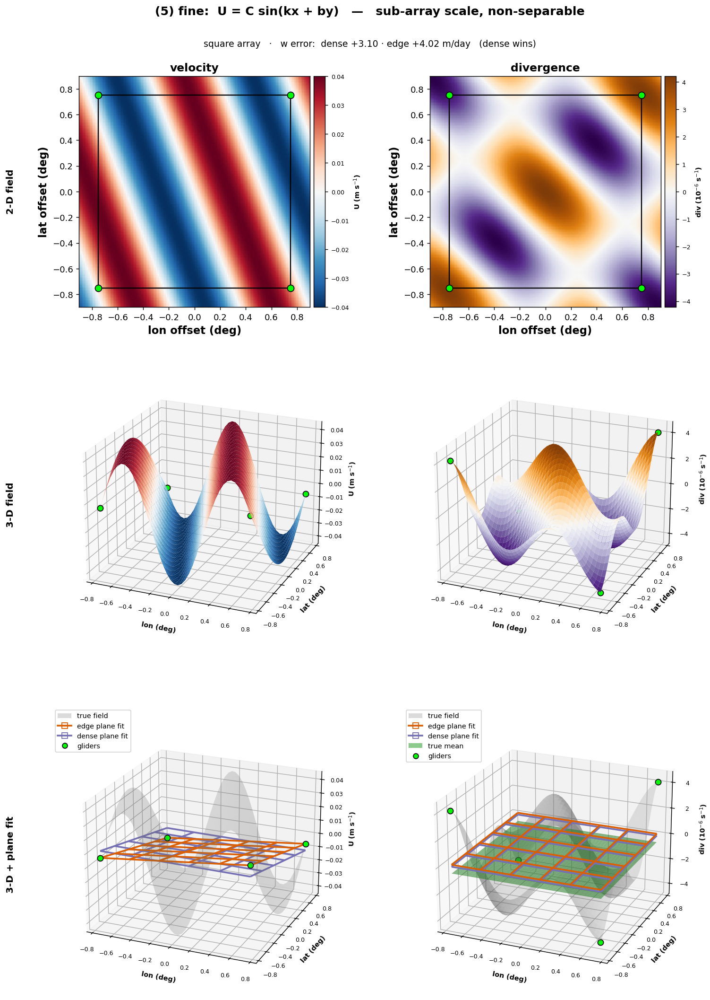

saved /home/edavenport/analysis/tpose24-osse/test_figs/square/mechanism_combo.png


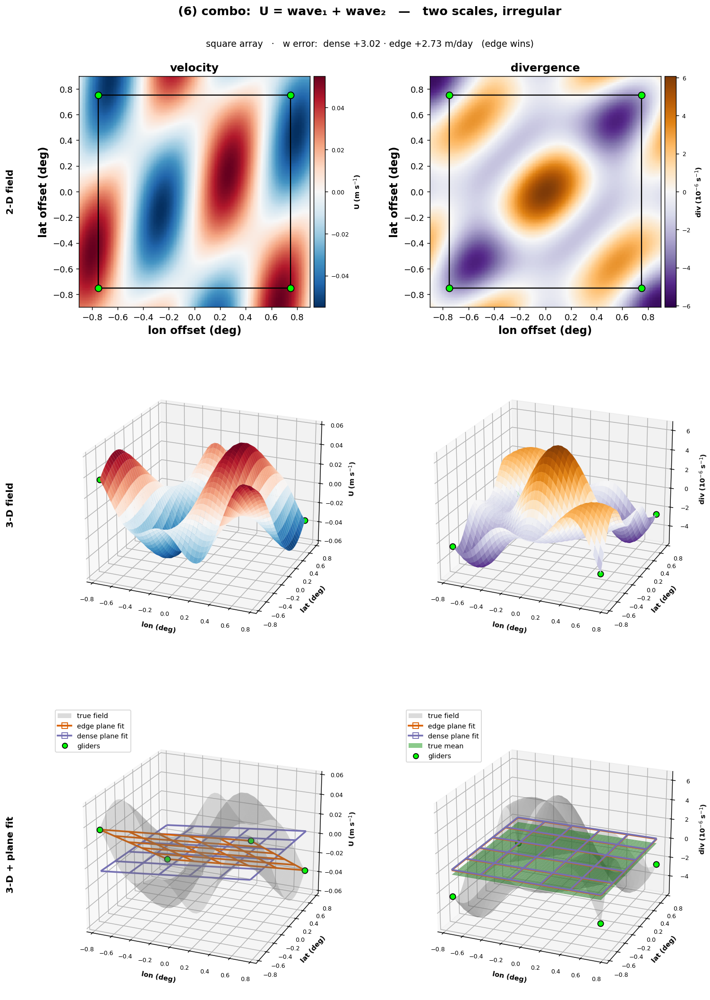

saved /home/edavenport/analysis/tpose24-osse/test_figs/hexagon/mechanism_linear.png


saved /home/edavenport/analysis/tpose24-osse/test_figs/hexagon/mechanism_even.png


saved /home/edavenport/analysis/tpose24-osse/test_figs/hexagon/mechanism_odd.png


saved /home/edavenport/analysis/tpose24-osse/test_figs/hexagon/mechanism_mixed.png


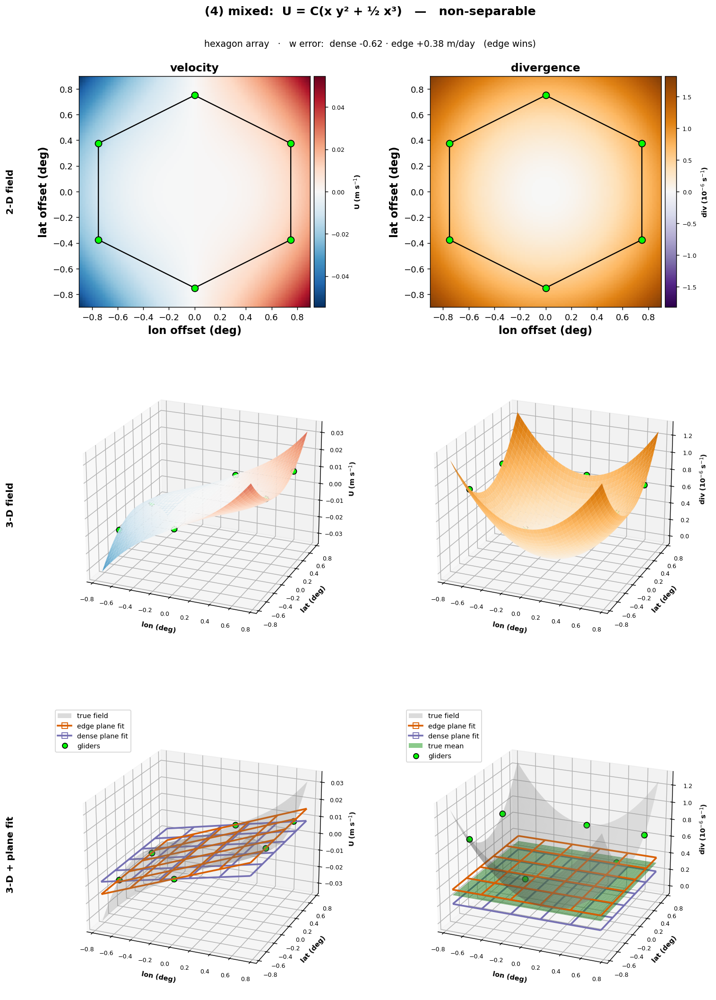

saved /home/edavenport/analysis/tpose24-osse/test_figs/hexagon/mechanism_fine.png


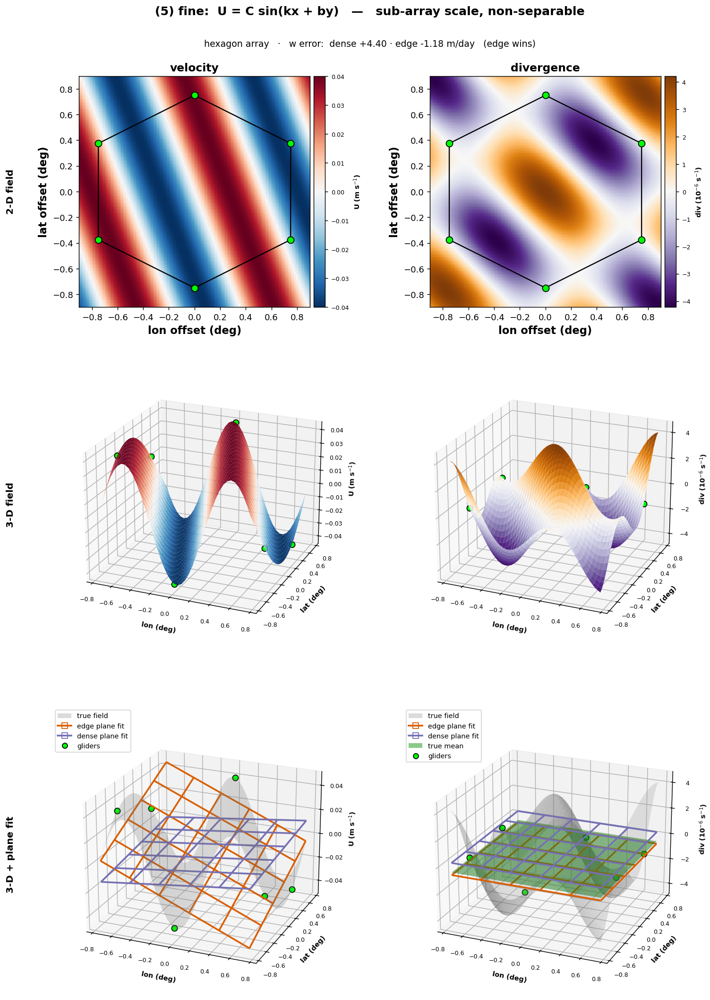

saved /home/edavenport/analysis/tpose24-osse/test_figs/hexagon/mechanism_combo.png


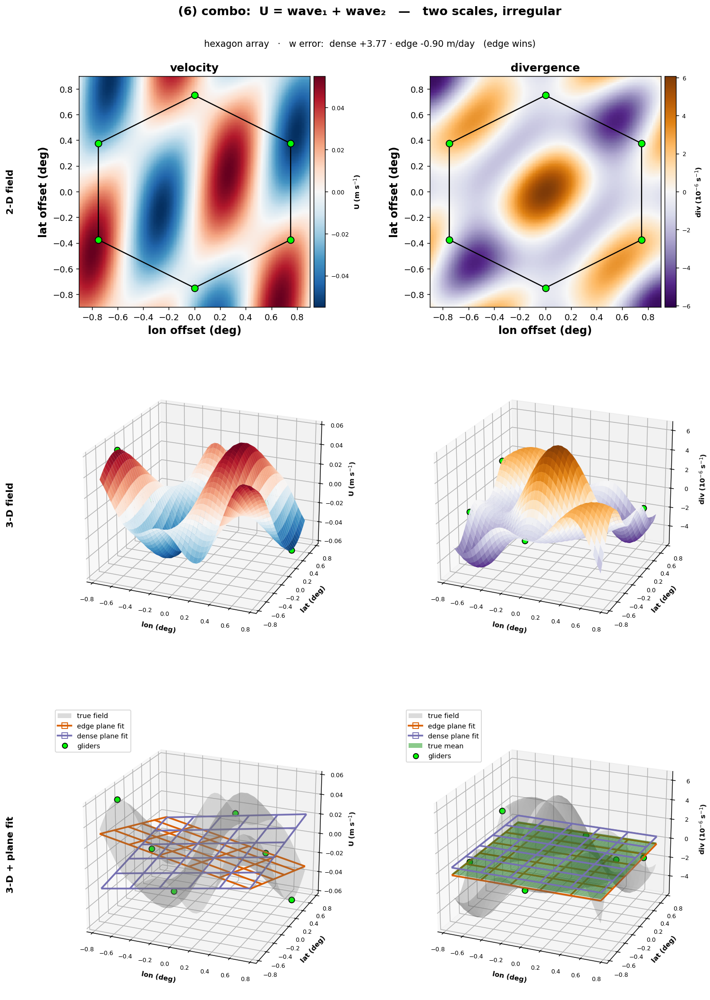

saved /home/edavenport/analysis/tpose24-osse/test_figs/diamond/mechanism_linear.png


saved /home/edavenport/analysis/tpose24-osse/test_figs/diamond/mechanism_even.png


saved /home/edavenport/analysis/tpose24-osse/test_figs/diamond/mechanism_odd.png


saved /home/edavenport/analysis/tpose24-osse/test_figs/diamond/mechanism_mixed.png


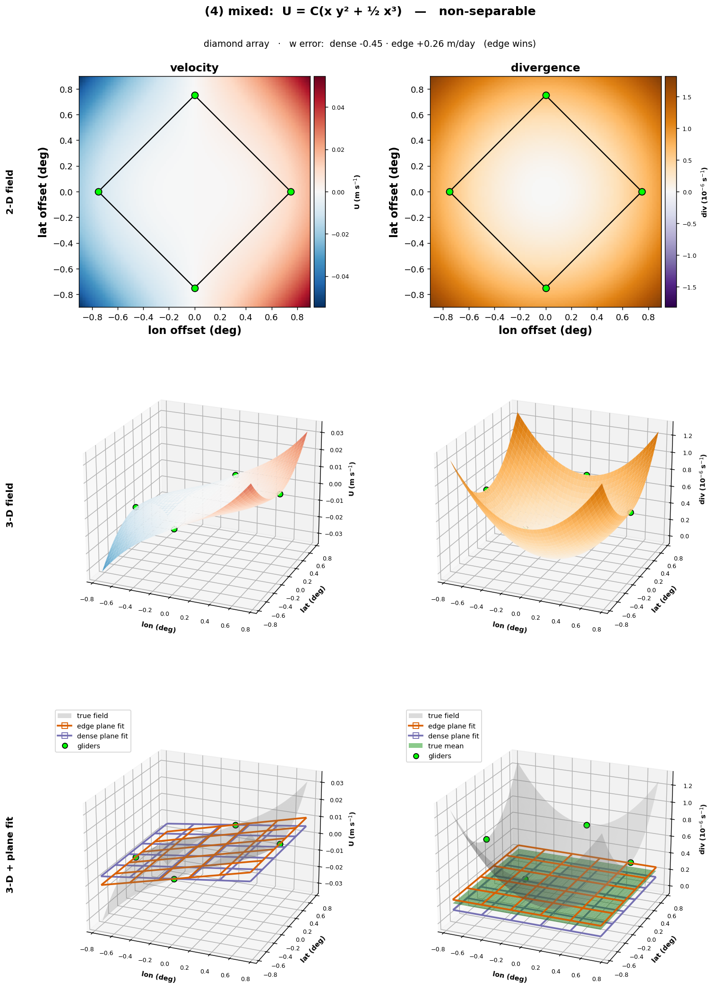

saved /home/edavenport/analysis/tpose24-osse/test_figs/diamond/mechanism_fine.png


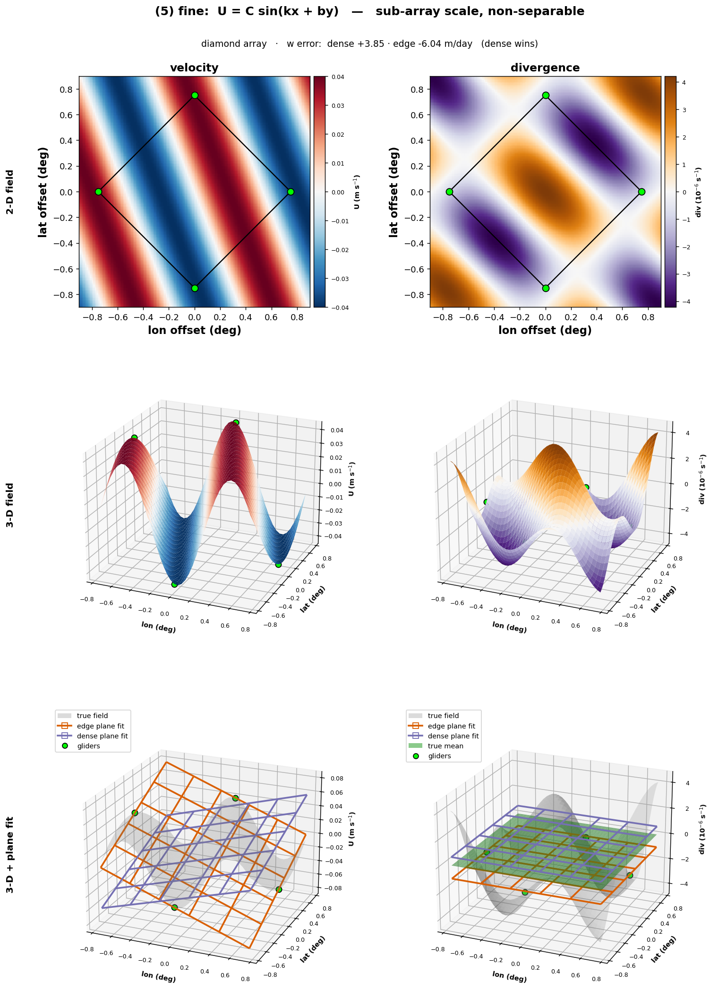

saved /home/edavenport/analysis/tpose24-osse/test_figs/diamond/mechanism_combo.png


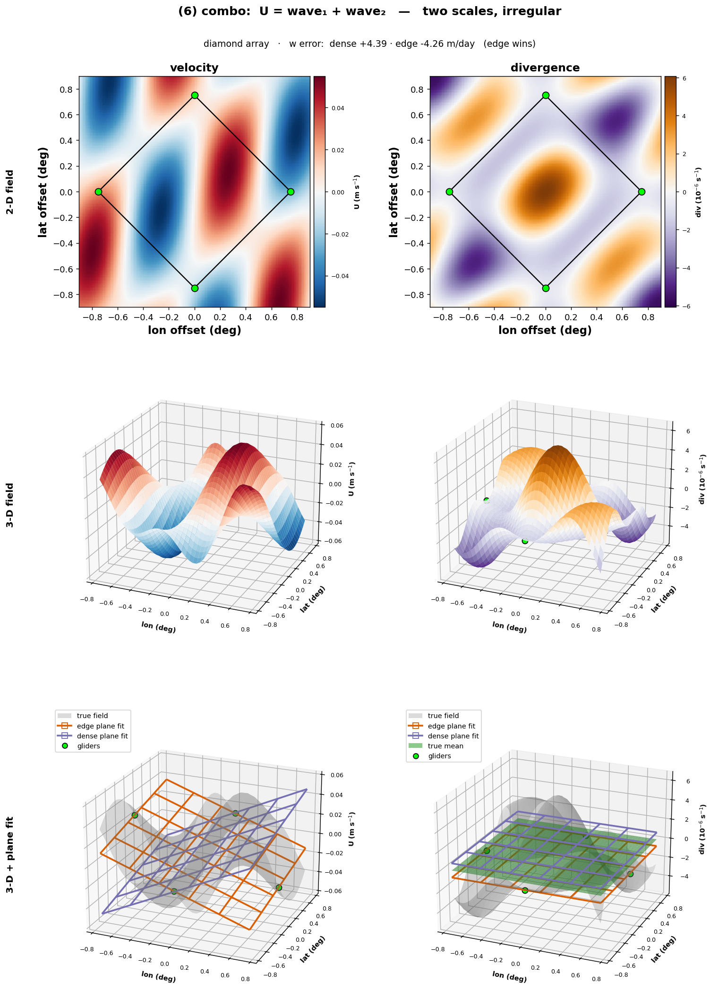

In [5]:
from IPython.display import display
for shp in tfp.FIG_SHAPES:
    for nm in tfp.CASE_ORDER:
        fn = tfp.fig_case(nm, shp)
        print('saved', fn)
        if tfp.SHAPE_DIR[shp] == 'square' or nm in ('mixed', 'fine', 'combo'):
            display(Image(fn))


## Step 5 — how the error scales with footprint size

Both plane-fit errors grow as **curvature × width²**. For the non-separable field the
edge-sampling error stays above dense at every size (a persistent penalty); the odd (separable)
edge error is ~0 at every size.

saved /home/edavenport/analysis/tpose24-osse/test_figs/error_vs_width.png


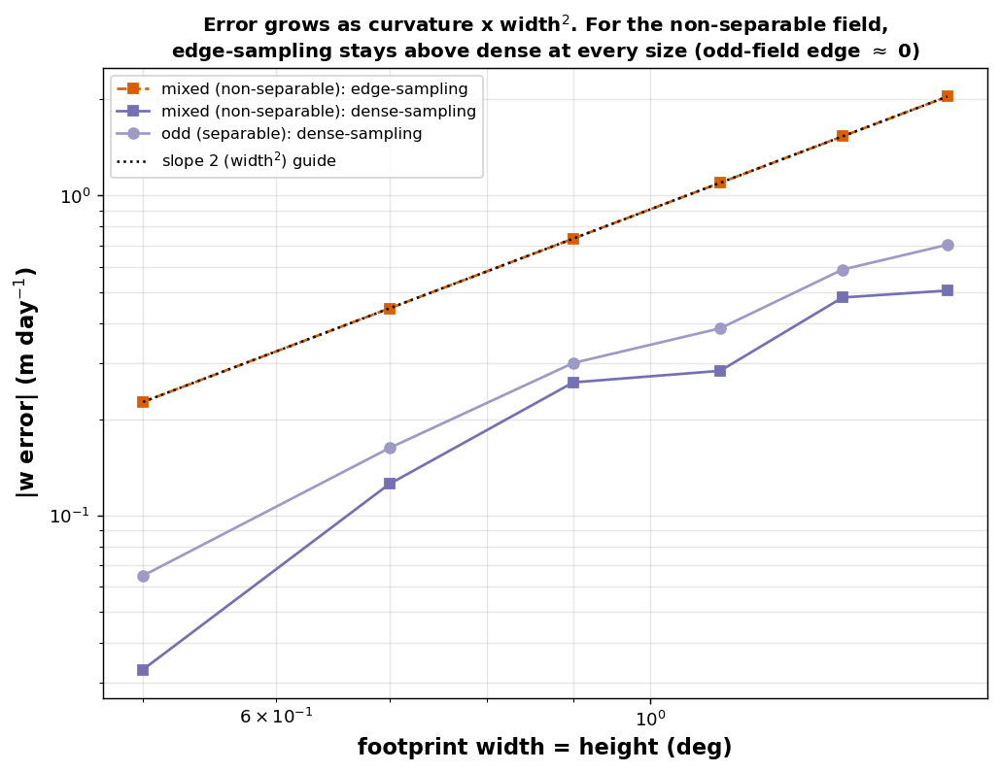

In [6]:
fn = tfp.fig_error_vs_width(); print('saved', fn); Image(fn)

## Step 6 — the real TPOSE24 field

On the real mean field the 4-corner **edge sampling is consistently worse than dense** (the
field's along-edge structure is exactly the mixed-case effect, now on real data), and shrinking
the footprint does **not** drive the error to zero: it falls to an O(0.1 m/day) grid-scale
floor, then rises as the plane fit degenerates. *(Skips gracefully if the cache is
unavailable.)*


  real-field footprint shrink (grid ~0.042 deg), median & RMS |w err| over 2S-2N, 212-230E:
      width kind        median         rms  (m/day)


      2.000 dense    1.785e-01   2.561e-01


      2.000 edge     2.335e-01   3.507e-01


      1.500 dense    1.567e-01   2.366e-01
      1.500 edge     2.425e-01   3.623e-01


      1.000 dense    1.433e-01   2.113e-01
      1.000 edge     2.263e-01   3.587e-01


      0.750 dense    1.293e-01   2.007e-01
      0.750 edge     2.208e-01   3.504e-01


      0.500 dense    1.142e-01   1.825e-01
      0.500 edge     1.958e-01   3.260e-01


      0.375 dense    9.953e-02   1.631e-01
      0.375 edge     1.678e-01   2.854e-01


      0.250 dense    9.836e-02   1.641e-01
      0.250 edge     1.723e-01   3.054e-01


      0.188 dense    8.445e-02   1.476e-01
      0.188 edge     1.249e-01   2.327e-01
      0.125 dense    8.243e-02   1.491e-01
      0.125 edge     1.102e-01   2.075e-01


      0.083 dense    1.094e+00   1.659e+00
      0.083 edge     2.328e-01   4.310e-01


saved /home/edavenport/analysis/tpose24-osse/test_figs/real_field_shrink.png


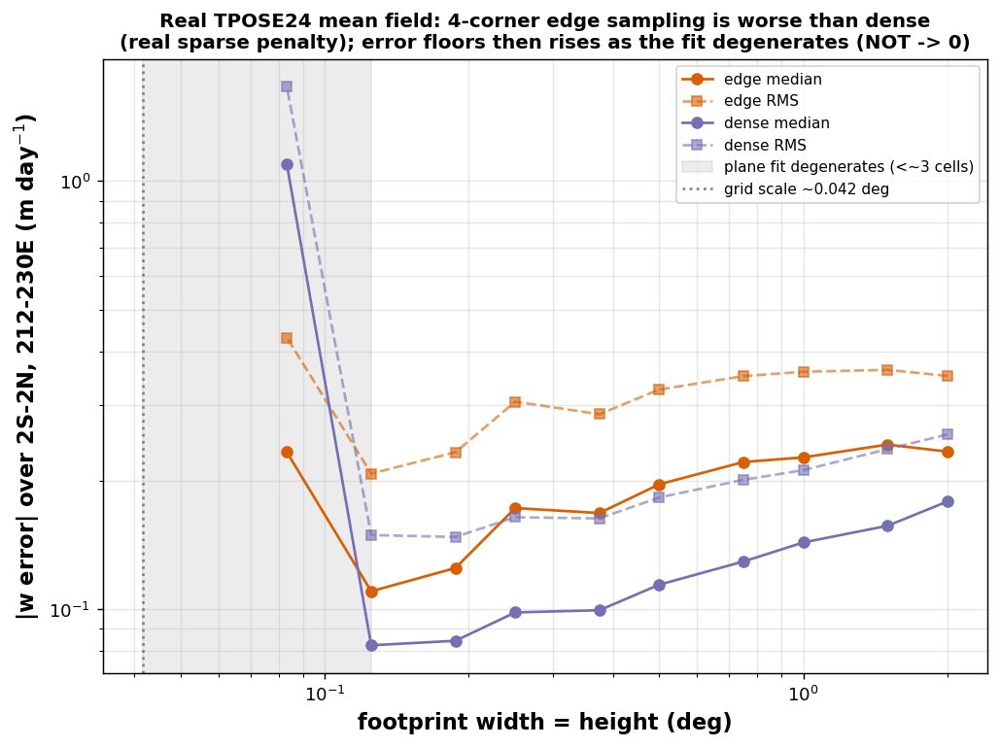

In [7]:
fn = tfp.fig_real_field_shrink()
print('saved', fn) if fn else print('cache unavailable — demo skipped')
Image(fn) if fn else None


## Caveat — footprint-mask alignment (grid-based truth only)

The synthetic tests above use a **closed-form** truth, so they are immune. This only affects the
production maps' grid-based truth, and the real 1/24° grid never hits the aligned regime.

In [8]:
tfp.report_mask_alignment_caveat()


  mask-alignment caveat (grid-based truth only; synthetic tests use closed form):
    footprint half/dx= 30.00  aligned=True  mask rows-symmetric=False
    footprint half/dx= 21.43  aligned=False mask rows-symmetric=True
    real grid dx=0.0417: all analysis footprint masks symmetric = True  -> study maps unaffected


## Play with it

Change the knobs and re-run this cell to see how the split moves. For example, raising the
**cross-term** weight (which controls along-edge variation) increases the edge penalty for the
mixed case; a purer cubic makes the odd case's dense bias grow. This recomputes the table
without overwriting the saved figures.

In [9]:
# --- KNOBS: edit and re-run ---
tfp.C_MIX = 0.05      # cross-term amplitude (along-edge variation -> edge penalty)
tfp.C_ODD = 0.03125   # cubic amplitude (interior curvature -> dense bias)

res_play = tfp.compute_cases()
tfp.print_table(res_play)



  synthetic footprint w-error  (square4 1.5x1.5 deg, 70 m, dense sampling at model dx=0.0417 deg):
    case        truth_div    dense_div     edge_div  wERR dense   wERR edge  winner
    linear      2.248e-06    2.248e-06    2.248e-06      -0.000      +0.000  tie
    even        0.000e+00   -3.148e-23   -1.059e-22      -0.000      -0.000  tie
    odd         3.162e-07    2.000e-07    3.162e-07      -0.702      +0.000  edge
    mixed       4.216e-07    3.380e-07    7.588e-07      -0.505      +2.040  dense
    fine       -5.215e-07   -8.659e-09    1.427e-07      +3.102      +4.017  dense
    combo      -3.099e-07    1.892e-07    1.414e-07      +3.019      +2.729  edge
